# NEURAL NETWORKS AND DEEP LEARNING FINAL PROJECT
---
---
## Course Name: NEURAL NETWORKS AND DEEP LEARNING
## Academic Year: 2023/24
## Supervisor of the Course: Dr. Jacopo Pegoraro
## Learning Assistants of the Course: Dr. Daniele Mari, Dr. Riccardo Mazzieri
---
---
##Group Members
---
Name  | Surname  |  Student Number | Faculty | Contributions
 --- | --- | --- | --- | ---
 **ÖMER CEM** | **TABAR** | **2081169**| **Padova University - ICT for Internet and Multimedia Cybersystems Engineering** | **Project Owner**




# Dataset Information
---
The CompCars dataset contains data from two scenarios, including images from web-nature and surveillance-nature. The images of the web-nature are collected from car forums, public websites, and search engines. The images of the surveillance-nature are collected by surveillance cameras.

In particular, you can observe the distrubutions as follows:

Dataset Name  | # Car Make  |  # Car Model | # Car Image | # Part Image
 --- | --- | --- | --- | ---
 **web-nature Data** | **163** | **1,687**| **136,642** | **27,618**
 **Survelliance Data** | **163** | **1,687**| **50,000** | **0**

```markdown
1. Car Hierarchy The car models can be organized into a large tree structure, consisting of three layers:
  * car make
  * car model
  * year of manufacture

2. Car Attributes Each car model is labeled with five attributes, including:
  * maximum speed (implicit attribute)
  * displacement (implicit attribute)
  * number of doors (explicit attribute)
  * number of seats (explicit attribute)
  * type of car (explicit attribute)
  These attributes provide rich information while learning the relations or similarities between different car models.

3. Viewpoints labeled five viewpoints for each car model, including:
  * front (F)
  * rear (R)
  * side (S)
  * front-side (FS)
  * rear-side (RS)

4. Car Parts collected images capturing the eight car parts for each car model including:
  * headlight (exterior parts)
  * taillight (exterior parts)
  * fog light (exterior parts)
  * air intake (exterior parts)
  * console (interior parts)
  * steering wheel (interior parts)
  * dashboard (interior parts)
  * gear lever (interior parts)
```
```markdown
1. Image File: Stores all full car images in the path format 'make_id/model_id/released_year/image_name.jpg'
2. Label File: Stores all labels to the full car images in the path format 'make_id/model_id/released_year/image_name.txt'.
  Each label file has three lines:
    1. The first line is a number which is the viewpoint annotation
      * (-1) - uncertain
      * (1) - front
      * (2) - rear
      * (3) - side
      * (4) - front-side
      * (5) - rear-side
    2. The second line is the number of the bounding boxes, which is all '1' in the current release.
    3. The third line is the coordinates of the bounding box in the format:
      * '(x1) (y1) (x2) (y2)' in pixels
      * where 1 <= (x1) < (x2) <= image_width,
      * where 1 <= (y1) < (y2) <= image_height
3. Part File: Stores all part images in the path format 'make_id/model_id/released_year/part_id/image_name.jpg'
The correspondance of 'part_id' and part names are:
  * (1) - headlight
  * (2) - taillight
  * (3) - fog light
  * (4) - air intake
  * (5) - console
  * (6) - steering wheel
  * (7) - dashboard
  * (8) - gear lever
```


# Dataset Preparation - Data Preprocessing
---


In [1]:
import os
import shutil
import pandas as pd
import h5py
import random
import itertools
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import expit
from collections import Counter
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.model_selection import train_test_split

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset, random_split
from torchvision import transforms
import torchvision.models as models
from torch.utils.data.sampler import WeightedRandomSampler
from torch.utils.data import WeightedRandomSampler, DataLoader
from torch.utils.data import Subset

seed = 2003
random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)

In [5]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    print("MPS (GPU) backend is not available")
    print("Using CPU backend")
    device = torch.device("cpu")
print(f"SELECTED DEVICE: {device}")

SELECTED DEVICE: mps


In [59]:
import os
import shutil

# Define source and destination directories
root_images = '/Users/cemtabarmacbookpro/Desktop/data/image'
file_directory = '/Users/cemtabarmacbookpro/Desktop/carmake_models_new'

# Folder hierarchy root >> make >> model >> year >> image(.jpg)
for make in os.listdir(root_images):
    make_path = os.path.join(root_images, make)
    
    # Check if it is a directory (make folder)
    if os.path.isdir(make_path):
        for model in os.listdir(make_path):
            model_path = os.path.join(make_path, model)
            
            # Check if it is a directory (model folder)
            if os.path.isdir(model_path):
                for year in os.listdir(model_path):
                    year_path = os.path.join(model_path, year)
                    
                    # Check if it is a directory (year folder)
                    if os.path.isdir(year_path):
                        for image_name in os.listdir(year_path):
                            if image_name.endswith('.jpg'):
                                # Source image path
                                image_path = os.path.join(year_path, image_name)
                                
                                # Create the new folder name "make_model"
                                new_folder_name = f"{make}_{model}"
                                new_folder_path = os.path.join(file_directory, new_folder_name)
                                
                                # Create the destination folder if it doesn't exist
                                os.makedirs(new_folder_path, exist_ok=True)
                                
                                # Destination image path
                                new_image_path = os.path.join(new_folder_path, image_name)
                                
                                # Copy the image to the new folder
                                shutil.copy(image_path, new_image_path)

                                print(f"Copied {image_name} to {new_folder_name}")


Copied deab76f22e8937.jpg to 135_947
Copied b00fef3e12bdf0.jpg to 135_947
Copied 69ada64edf3ebb.jpg to 135_947
Copied 60b5fa727f82f2.jpg to 135_947
Copied 83ce148be0dcb5.jpg to 135_947
Copied 13916301245610.jpg to 135_947
Copied 6c0b42e75ca247.jpg to 135_947
Copied 26eeecb834a607.jpg to 135_947
Copied 6eb62be44a79c6.jpg to 135_947
Copied 6c21604f0ee59f.jpg to 135_947
Copied 2fed76a9e79c11.jpg to 135_947
Copied f2b269e5a456a7.jpg to 135_947
Copied 7032da89a64e35.jpg to 135_947
Copied a84632d35b692d.jpg to 135_947
Copied 7791452aba08a4.jpg to 135_947
Copied 8bd01b7f9f75e6.jpg to 135_947
Copied cc2a128df97e95.jpg to 135_947
Copied 2363729fc5d15c.jpg to 135_947
Copied ee1c877e577a49.jpg to 135_947
Copied dd544cdfc06d2e.jpg to 135_947
Copied 5fcb9ed2d8abc9.jpg to 135_947
Copied 5845eb2dec2c26.jpg to 135_947
Copied b09904ea09f6e6.jpg to 135_947
Copied 82ce62aa3c4e27.jpg to 135_947
Copied 826a5fd082682c.jpg to 135_947
Copied c07ff3414cb19c.jpg to 135_947
Copied 815db2a9fcf3ba.jpg to 135_947
C

In [37]:
import os
from PIL import Image
from torch.utils.data import Dataset
from collections import Counter

class CustomCarDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.label_map = {}
        self._prepare_dataset()

    def _prepare_dataset(self):
        mm_folders = os.listdir(self.root_dir)
        label_counts = Counter()
        temporary_image_paths = []
        temporary_labels = []

        print(f"Found folders: {mm_folders}")

        for folder in mm_folders:
            folder_path = os.path.join(self.root_dir, folder)
            
            # Check if it's a directory
            if not os.path.isdir(folder_path):
                print(f"Skipping non-directory: {folder}")
                continue

            print(f"Processing folder: {folder}")
            
            for image_name in os.listdir(folder_path):
                if image_name.endswith('.jpg'):
                    image_path = os.path.join(folder_path, image_name)
                    temporary_image_paths.append(image_path)
                    temporary_labels.append(folder)
                    label_counts[folder] += 1

        print(f"Label counts: {label_counts}")

        # Filter labels with more than 79 images
        valid_labels = [label for label, count in label_counts.items() if count > 79]
        print(f"Labels with more than 79 images: {valid_labels}")

        # Sort the labels alphabetically for consistent indexing
        valid_labels.sort()
        
        # Create label-to-index mapping
        self.label_map = {label: idx for idx, label in enumerate(valid_labels)}
        print(f"Label map: {self.label_map}")

        # Print the class numbers and their corresponding labels
        print("Class indices and their corresponding labels:")
        for idx, label in enumerate(valid_labels):
            print(f"Index {idx}: {label}")

        # Filter images and labels based on valid labels
        for img_path, label in zip(temporary_image_paths, temporary_labels):
            if label in valid_labels:
                self.image_paths.append(img_path)
                self.labels.append(self.label_map[label])

        print(f"Total images after filtering: {len(self.image_paths)}")

        if len(self.image_paths) == 0:
            raise ValueError("No valid samples found. Please check the dataset structure or filtering condition.")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")  # Just in case, since it is already in RGB
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label


In [7]:
#Defining transformations

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [9]:

#CustomCarDataset was put in a file called dataset.py for enabling the jupyter notebook run in multiple threads
#For simplicity, put the above mentioned function in a .py file, name it as dataset.py and import inside your project
#Otherwise, you will face with the issue that anaconda environement is not able to run multiple processes on the CustomCarDataset
from dataset import CustomCarDataset
full_dataset = CustomCarDataset(root_dir='/Users/cemtabarmacbookpro/Desktop/carmake_models_new', transform=None)

print(f"Number of images: {len(full_dataset.image_paths)}")
print(f"Number of labels: {len(full_dataset.labels)}")
print(f"Unique labels after filtering: {len(set(full_dataset.labels))}")

if len(full_dataset.labels) == 0:
    raise ValueError("No valid samples found. Please check the dataset structure or filtering condition.")

#LABELS FOR SPLITTING
labels = full_dataset.labels

#STRATIFICATION PROCESS BASED ON LABELS
train_indices, temp_indices, train_labels, temp_labels = train_test_split(
    range(len(labels)), labels, stratify=labels, test_size=0.3, random_state=42
)

val_indices, test_indices, val_labels, test_labels = train_test_split(
    temp_indices, temp_labels, stratify=temp_labels, test_size=0.5, random_state=42
)

#CREATION OF THE SUBSETS
train_dataset = Subset(full_dataset, train_indices)
val_dataset = Subset(full_dataset, val_indices)
test_dataset = Subset(full_dataset, test_indices)

#TRANSFORMATION OPERATIONS TO THE SUBSETS
train_dataset.dataset.transform = train_transform
val_dataset.dataset.transform = val_test_transform
test_dataset.dataset.transform = val_test_transform


Found folders: ['145_521', '92_747', '158_1280', '44_1769', '77_162', '79_1726', '131_1021', '73_474', '139_1645', '158_1274', '11_742', '37_1991', '35_560', '11_745', '35_558', '19_1898', '139_1642', '73_473', '73_487', '145_526', '158_1287', '109_1545', '147_1553', '131_1019', '137_1728', '145_519', '54_202', '69_1489', '159_1568', '36_550', '73_445', '69_1474', '84_1971', '103_1844', '131_1010', '120_1691', '46_1295', '77_153', '69_1480', '92_749', '160_792', '44_1767', '69_1487', '159_1566', '77_154', '145_517', '69_1473', '103_1843', '131_1017', '60_351', '73_442', '160_795', '145_528', '97_856', '149_1804', '28_1871', '28_1885', '3_1758', '100_236', '102_255', '15_838', '34_569', '97_869', '122_595', '162_1628', '76_366', '100_209', '85_376', '162_1610', '150_379', '28_1882', '100_231', '124_1406', '77_138', '28_1876', '74_1296', '45_1028', '21_1307', '81_88', '130_1760', '81_81', '162_1626', '97_893', '128_1894', '81_75', '102_290', '15_836', '97_867', '34_567', '53_777', '70_18

In [11]:
# Create a sampler for the training set
#It is due to class imbalance in the training set
#With the sampler considered images in the batches will be more balanced
train_labels = [train_dataset.dataset.labels[i] for i in train_dataset.indices]
class_counts = Counter(train_labels)
total_samples = len(train_labels)
weights = [1.0 / class_counts[label] for label in train_labels]
weights = torch.tensor(weights, dtype=torch.float32)

sampler = WeightedRandomSampler(weights.tolist(), num_samples=total_samples, replacement=True)


# Define the DataLoader
train_loader = DataLoader(
    train_dataset,
    batch_size=64,
    sampler=sampler,
    num_workers=os.cpu_count(),
    pin_memory=True  # Since we are using GPU, otherwise make it False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=os.cpu_count(),
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=os.cpu_count(),
    pin_memory=True
)


In [75]:
#This cell is dedicated for the check tasks that are considered before training the model.
#All corresponfing functions can be followed under this cell

# Check class distribution with DataLoader
def check_class_distribution_loader(dataloader_name):
    labels = []
    for i, (images, batch_labels) in tqdm(enumerate(dataloader_name), desc="Dataloader is processing"):
        labels.extend(batch_labels.tolist())
        
    label_counts = Counter(labels)
    number_of_classes = len(label_counts)
    print(f"Number of unique classes: {number_of_classes}")
    print(f"Class distribution: {label_counts}")
    


In [15]:
check_class_distribution_loader(train_loader)
check_class_distribution_loader(val_loader)
check_class_distribution_loader(test_loader)

Dataloader is processing: 1215it [01:50, 10.99it/s]

Number of unique classes: 927
Class distribution: Counter({748: 115, 454: 114, 343: 110, 844: 110, 775: 110, 859: 108, 272: 108, 460: 107, 135: 107, 329: 107, 43: 106, 754: 106, 497: 105, 453: 104, 907: 103, 435: 103, 239: 103, 655: 103, 619: 102, 617: 102, 33: 101, 566: 101, 588: 101, 216: 101, 452: 101, 661: 101, 921: 101, 352: 100, 649: 100, 392: 100, 634: 100, 854: 100, 643: 100, 85: 100, 395: 100, 825: 100, 727: 100, 847: 100, 575: 100, 401: 100, 699: 99, 394: 99, 762: 99, 677: 99, 296: 99, 321: 99, 377: 99, 318: 99, 510: 99, 878: 98, 564: 98, 665: 98, 30: 98, 605: 98, 131: 98, 21: 98, 840: 98, 75: 98, 906: 97, 820: 97, 362: 97, 767: 97, 110: 97, 139: 97, 6: 97, 719: 97, 441: 96, 55: 96, 181: 96, 495: 96, 432: 96, 515: 96, 674: 96, 301: 96, 609: 96, 896: 96, 517: 96, 108: 96, 740: 96, 489: 96, 0: 96, 702: 96, 444: 96, 612: 96, 196: 96, 646: 96, 690: 96, 183: 96, 278: 96, 641: 95, 313: 95, 342: 95, 823: 95, 230: 95, 63: 95, 300: 95, 325: 95, 584: 95, 40: 95, 592: 95, 785: 95, 451: 


Dataloader is processing: 261it [01:11,  3.67it/s]

Number of unique classes: 927
Class distribution: Counter({622: 46, 834: 43, 389: 43, 755: 41, 391: 36, 836: 35, 264: 35, 800: 34, 178: 32, 96: 31, 799: 30, 778: 30, 570: 29, 28: 29, 619: 27, 802: 27, 641: 27, 723: 27, 786: 25, 754: 25, 797: 25, 97: 25, 477: 25, 412: 25, 42: 25, 729: 25, 174: 25, 382: 25, 161: 24, 490: 24, 231: 24, 484: 24, 15: 24, 361: 24, 892: 24, 542: 24, 91: 23, 798: 23, 827: 23, 617: 23, 505: 23, 752: 23, 179: 23, 903: 23, 812: 23, 804: 22, 461: 22, 661: 22, 144: 22, 4: 22, 722: 22, 637: 22, 409: 22, 689: 22, 6: 22, 835: 22, 405: 22, 907: 22, 724: 22, 789: 21, 388: 21, 288: 21, 292: 21, 433: 21, 825: 21, 686: 21, 890: 21, 881: 21, 555: 21, 379: 21, 829: 21, 25: 21, 882: 21, 385: 20, 215: 20, 687: 20, 753: 20, 866: 20, 674: 20, 434: 20, 703: 20, 308: 20, 485: 20, 510: 20, 803: 20, 135: 20, 223: 20, 24: 20, 102: 20, 446: 20, 777: 20, 556: 20, 711: 20, 590: 20, 709: 20, 275: 20, 776: 19, 472: 19, 767: 19, 844: 19, 184: 19, 429: 19, 914: 19, 891: 19, 138: 19, 291: 19,


Dataloader is processing: 261it [01:11,  3.67it/s]

Number of unique classes: 927
Class distribution: Counter({622: 45, 389: 43, 834: 42, 755: 41, 800: 35, 836: 35, 391: 35, 264: 34, 178: 32, 96: 31, 570: 30, 778: 30, 28: 30, 799: 29, 619: 28, 802: 27, 723: 26, 42: 26, 412: 26, 641: 26, 797: 25, 382: 25, 484: 25, 786: 25, 97: 25, 754: 25, 161: 24, 892: 24, 729: 24, 15: 24, 477: 24, 361: 24, 174: 24, 542: 23, 903: 23, 835: 23, 490: 23, 798: 23, 6: 23, 505: 23, 812: 23, 231: 23, 617: 23, 4: 22, 661: 22, 825: 22, 804: 22, 637: 22, 461: 22, 752: 22, 433: 22, 144: 22, 91: 22, 179: 22, 722: 22, 724: 22, 405: 22, 388: 22, 907: 22, 827: 22, 890: 21, 789: 21, 881: 21, 686: 21, 379: 21, 409: 21, 25: 21, 288: 21, 102: 21, 689: 21, 674: 21, 753: 21, 829: 21, 24: 20, 882: 20, 135: 20, 777: 20, 99: 20, 556: 20, 709: 20, 385: 20, 767: 20, 434: 20, 866: 20, 590: 20, 292: 20, 223: 20, 703: 20, 555: 20, 485: 20, 609: 20, 803: 20, 510: 20, 138: 20, 741: 20, 308: 20, 275: 20, 891: 19, 914: 19, 711: 19, 446: 19, 732: 19, 162: 19, 687: 19, 71: 19, 215: 19, 1

In [13]:
def print_dataloader_sizes(train_loader, val_loader, test_loader):
    training_samples = len(train_loader.dataset)
    validation_samples = len(val_loader.dataset)
    test_samples = len(test_loader.dataset)
    
    print(f"Number of training samples: {training_samples}")
    print(f"Number of validation samples: {validation_samples}")
    print(f"Number of test samples: {test_samples}")


print_dataloader_sizes(train_loader, val_loader, test_loader)


Number of training samples: 77754
Number of validation samples: 16662
Number of test samples: 16662


# Network Definiton (ResNet50)
---

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from collections import Counter
from tqdm import tqdm

# Definition of the focal loss with the calculated alpha
#alpha=1 means give the same importance to every class
#alpha=alpa means calculating the alpha according to the class distrubtions
class FocalLoss(torch.nn.Module):
    def __init__(self, alpha, gamma=2, num_classes=927):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.num_classes = num_classes
        self.cross_entropy_loss = torch.nn.CrossEntropyLoss(reduction='none')

    def forward(self, inputs, targets):
        crossentropyloss = self.cross_entropy_loss(inputs, targets)
        probability = torch.exp(-crossentropyloss)
        focal_loss = self.alpha[targets] * (1 - probability) ** self.gamma * crossentropyloss
        return focal_loss.mean()

# Function for calculating alpha
def calculate_alpha_from_sampler(sampler, num_classes, device):
    
    weights = torch.tensor(sampler.weights.clone().detach(), dtype=torch.float32)
    #Computation of class frequencies from the weights
    class_weights = weights
    total_samples = weights.sum()
    alpha = total_samples / (num_classes * class_weights)
    alpha = alpha.to(device)
    return alpha

In [18]:
import torch
from torch import nn
from torch.nn import Conv2d, BatchNorm2d, ReLU, MaxPool2d, AvgPool2d, Linear, Sequential, Dropout

class MainPath(nn.Module):
    def __init__(self, in_channels, filters, kernel_size, stride=1):
        super().__init__()
        F1, F2, F3 = filters
        self.main_path = Sequential(
            Conv2d(in_channels, F1, kernel_size=1, stride=stride),
            BatchNorm2d(F1),
            ReLU(),
            Conv2d(F1, F2, kernel_size=kernel_size, padding=kernel_size//2),
            BatchNorm2d(F2),
            ReLU(),
            Conv2d(F2, F3, kernel_size=1),
            BatchNorm2d(F3),
        )
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, torch.nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()
        if isinstance(module, torch.nn.Conv2d):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        y = self.main_path(x)
        return y

class ConvolutionalBlock(nn.Module):
    def __init__(self, in_channels, filters, kernel_size):
        super().__init__()
        F1, F2, F3 = filters
        self.main_path = Sequential(
            Conv2d(in_channels, F1, kernel_size=1, stride=2),
            BatchNorm2d(F1),
            ReLU(),
            Conv2d(F1, F2, kernel_size=kernel_size, padding=kernel_size//2),
            BatchNorm2d(F2),
            ReLU(),
            Conv2d(F2, F3, kernel_size=1),
            BatchNorm2d(F3),
        )
        self.shortcut_path = Sequential(
            Conv2d(in_channels, F3, kernel_size=1, stride=2),
            BatchNorm2d(F3)
        )
        self.relu = ReLU()
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, torch.nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()
        if isinstance(module, torch.nn.Conv2d):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        shortcut = self.shortcut_path(x)
        y = self.main_path(x)
        y += shortcut
        y = self.relu(y)
        return y

class IdentityBlock(nn.Module):
    def __init__(self, in_channels, filters, kernel_size):
        super().__init__()
        F1, F2, F3 = filters
        self.main_path = Sequential(
            Conv2d(in_channels, F1, kernel_size=1),
            BatchNorm2d(F1),
            ReLU(),
            Conv2d(F1, F2, kernel_size=kernel_size, padding=kernel_size//2),
            BatchNorm2d(F2),
            ReLU(),
            Conv2d(F2, F3, kernel_size=1),
            BatchNorm2d(F3),
        )
        self.relu = ReLU()
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, torch.nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()
        if isinstance(module, torch.nn.Conv2d):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        identity = x
        y = self.main_path(x)
        y += identity
        y = self.relu(y)
        return y

class ResNet50(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.3):
        super().__init__()
        self.resnet_layers = Sequential(
            Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            BatchNorm2d(64),
            ReLU(),
            MaxPool2d(kernel_size=3, stride=2, padding=1),
            ConvolutionalBlock(64, [64, 64, 256], kernel_size=3),
            IdentityBlock(256, [64, 64, 256], kernel_size=3),
            IdentityBlock(256, [64, 64, 256], kernel_size=3),
            ConvolutionalBlock(256, [128, 128, 512], kernel_size=3),
            IdentityBlock(512, [128, 128, 512], kernel_size=3),
            IdentityBlock(512, [128, 128, 512], kernel_size=3),
            IdentityBlock(512, [128, 128, 512], kernel_size=3),
            ConvolutionalBlock(512, [256, 256, 1024], kernel_size=3),
            IdentityBlock(1024, [256, 256, 1024], kernel_size=3),
            IdentityBlock(1024, [256, 256, 1024], kernel_size=3),
            IdentityBlock(1024, [256, 256, 1024], kernel_size=3),
            IdentityBlock(1024, [256, 256, 1024], kernel_size=3),
            ConvolutionalBlock(1024, [512, 512, 2048], kernel_size=3),
            IdentityBlock(2048, [512, 512, 2048], kernel_size=3),
            IdentityBlock(2048, [512, 512, 2048], kernel_size=3),
            AvgPool2d(kernel_size=4, stride=1)  # Adjusted kernel_size
        )
        self.classification_layer = Linear(2048, num_classes)
        self.dropout = Dropout(dropout_rate)
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, torch.nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()
        if isinstance(module, torch.nn.Conv2d):
            torch.nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        y = self.resnet_layers(x)
        #print(y.size())
        y = y.flatten(start_dim=1)
        #print(y.size())
        y = self.dropout(y)
        #print(y.size())
        y = self.classification_layer(y)
        #print(y.size())
        return y


        



# Network Training
---

In [21]:
def load_checkpoint(model, optimizer, filename='checkpoint.pth'):
    try:
        checkpoint = torch.load(filename)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch']
        best_val_loss = checkpoint['best_val_loss']
        print(f"Checkpoint loaded: starting from epoch {start_epoch}")
        return start_epoch, best_val_loss
    except FileNotFoundError:
        print("No checkpoint found. Starting from scratch.")
        return 0, float('inf')  # Start from the first epoch

    
def save_checkpoint(model, optimizer, epoch, best_val_loss, filename='checkpoint.pth'):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_val_loss': best_val_loss
    }, filename)
    print(f"Checkpoint saved at epoch {epoch}")

# Call the function for calculating the alpha
alpha = calculate_alpha_from_sampler(sampler, 927, device)

# Initialize Focal Loss with computed alpha
criterion = FocalLoss(alpha=alpha, gamma=2, num_classes=927)

#Initialize the model
#Different dropout rates have been considered: 0.2, 0.3, 0.4 during training
model = ResNet50(num_classes=927, dropout_rate=0.3)

# Initialize the optimizer
#Different learning rates have been considered: 1e-2, 1e-4, 1e-3 during training
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

#Scheduler is important for changing the learning rate during training
#If the current learning rate not improving the model this will be triggered
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

model = model.to(device)

/var/folders/3g/0xpm7q4s2zv4n_bywf04j8n00000gn/T/ipykernel_5265/205053605.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  weights = torch.tensor(sampler.weights.clone().detach(), dtype=torch.float32)


In [29]:
# Training state
num_epochs = 50
start_epoch = 0
best_val_loss = float('inf')
patience = 3  # Number of epochs to wait for improvement
patience_counter = 0  # Counter to track epochs without improvement

# Training loop
for epoch in range(start_epoch, num_epochs):
    model.train()
    print(f"Epoch: {epoch + 1}")
    train_iterator = tqdm(train_loader)

    # Training phase
    for batch in train_iterator:
        batch_x, batch_y = batch  

        # Move data to device
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)

        # Forward pass
        y_pred = model(batch_x)
        loss = criterion(y_pred, batch_y)

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate training accuracy
        correct = (torch.argmax(y_pred, dim=1) == batch_y).sum().item()
        train_acc = correct / len(batch_y)
        train_iterator.set_description(f"Train loss: {loss.detach().cpu().numpy():.4f}, Train acc: {train_acc:.4f}")

    # Validation phase
    model.eval()
    val_iterator = tqdm(val_loader, desc="Validating")
    val_loss_sum = 0
    val_true_list = []
    val_predictions_list = []

    with torch.no_grad():
        for batch in val_iterator:
            batch_x, batch_y = batch  

            # Move data to device
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)

            # Validation forward pass
            val_pred = model(batch_x)

            # Store the predictions and true labels
            val_predictions_list.append(val_pred)
            val_true_list.append(batch_y)
    
    val_predictions = torch.cat(val_predictions_list, dim=0)
    val_true = torch.cat(val_true_list, dim=0)

    
    val_predictions = val_predictions.to(device)
    val_true = val_true.to(device)

    predicted_classes = torch.argmax(val_predictions, dim=1)
    val_acc = (predicted_classes == val_true).sum().item() / len(val_true)

    val_loss = criterion(val_predictions, val_true)
    val_loss_sum += val_loss.item()

    val_loss = val_loss_sum / len(val_loader)
    
    print(f"Validation loss: {val_loss:.4f}, Validation accuracy: {val_acc:.4f}")

    # Adjust learning rate using the scheduler based on validation loss
    scheduler.step(val_loss)

    # Print the current learning rate
    print(f"Current learning rate: {scheduler.get_last_lr()[0]:.6f}")

    # Save model if validation loss improves
    if val_loss < best_val_loss:
        print("Saving the best model...")
        torch.save(model.state_dict(), "model.pt")
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter since improvement was found
    else:
        patience_counter += 1  # Increment patience counter if no improvement

    # Save checkpoint after each epoch
    save_checkpoint(model, optimizer, epoch + 1, best_val_loss)

    # Check for early stopping
    if patience_counter >= patience:
        print("Early stopping triggered. No improvement in validation loss for 3 epochs.)
        break

Epoch: 1


Train loss: 341.0957, Train acc: 0.0000: 100%|█| 1215/1215 [06:51<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 1.1997, Validation accuracy: 0.0028
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 1
Epoch: 2


Train loss: 280.5049, Train acc: 0.0172: 100%|█| 1215/1215 [06:55<00:00,  2.93it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 1.1254, Validation accuracy: 0.0142
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 2
Epoch: 3


Train loss: 278.2763, Train acc: 0.0345: 100%|█| 1215/1215 [06:52<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.87it/s]


Validation loss: 1.0417, Validation accuracy: 0.0362
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 3
Epoch: 4


Train loss: 231.1740, Train acc: 0.0690: 100%|█| 1215/1215 [06:52<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.9274, Validation accuracy: 0.0669
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 4
Epoch: 5


Train loss: 170.1077, Train acc: 0.2241: 100%|█| 1215/1215 [06:50<00:00,  2.96it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.8337, Validation accuracy: 0.1152
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 5
Epoch: 6


Train loss: 151.2827, Train acc: 0.3276: 100%|█| 1215/1215 [06:51<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.7093, Validation accuracy: 0.1934
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 6
Epoch: 7


Train loss: 124.2810, Train acc: 0.3448: 100%|█| 1215/1215 [06:52<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.5943, Validation accuracy: 0.2715
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 7
Epoch: 8


Train loss: 79.4760, Train acc: 0.5517: 100%|█| 1215/1215 [06:52<00:00,  2.95it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.5509, Validation accuracy: 0.3142
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 8
Epoch: 9


Train loss: 54.1260, Train acc: 0.6379: 100%|█| 1215/1215 [06:55<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.5137, Validation accuracy: 0.3561
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 9
Epoch: 10


Train loss: 29.8233, Train acc: 0.7586: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.4666, Validation accuracy: 0.3936
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 10
Epoch: 11


Train loss: 20.5368, Train acc: 0.7931: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.4305, Validation accuracy: 0.4325
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 11
Epoch: 12


Train loss: 18.3052, Train acc: 0.8621: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.4289, Validation accuracy: 0.4280
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 12
Epoch: 13


Train loss: 24.8939, Train acc: 0.7931: 100%|█| 1215/1215 [06:50<00:00,  2.96it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.84it/s]


Validation loss: 0.4152, Validation accuracy: 0.4475
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 13
Epoch: 14


Train loss: 12.9198, Train acc: 0.8793: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.4037, Validation accuracy: 0.4643
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 14
Epoch: 15


Train loss: 4.0602, Train acc: 0.9310: 100%|█| 1215/1215 [06:53<00:00,  2.94it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.3906, Validation accuracy: 0.4851
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 15
Epoch: 16


Train loss: 21.3736, Train acc: 0.8448: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.3877, Validation accuracy: 0.4888
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 16
Epoch: 17


Train loss: 7.7213, Train acc: 0.8966: 100%|█| 1215/1215 [06:54<00:00,  2.93it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.3861, Validation accuracy: 0.4966
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 17
Epoch: 18


Train loss: 9.3884, Train acc: 0.8966: 100%|█| 1215/1215 [06:55<00:00,  2.92it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.3791, Validation accuracy: 0.4998
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 18
Epoch: 19


Train loss: 7.8192, Train acc: 0.9310: 100%|█| 1215/1215 [06:57<00:00,  2.91it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.3818, Validation accuracy: 0.5044
Current learning rate: 0.001000
Checkpoint saved at epoch 19
Epoch: 20


Train loss: 8.2801, Train acc: 0.8966: 100%|█| 1215/1215 [06:58<00:00,  2.91it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.4042, Validation accuracy: 0.4869
Current learning rate: 0.001000
Checkpoint saved at epoch 20
Epoch: 21


Train loss: 10.1433, Train acc: 0.9310: 100%|█| 1215/1215 [06:55<00:00,  2.92it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.3667, Validation accuracy: 0.5176
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 21
Epoch: 22


Train loss: 6.3482, Train acc: 0.9138: 100%|█| 1215/1215 [06:56<00:00,  2.91it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.3835, Validation accuracy: 0.5085
Current learning rate: 0.001000
Checkpoint saved at epoch 22
Epoch: 23


Train loss: 7.0078, Train acc: 0.9138: 100%|█| 1215/1215 [06:57<00:00,  2.91it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.3800, Validation accuracy: 0.5184
Current learning rate: 0.001000
Checkpoint saved at epoch 23
Epoch: 24


Train loss: 13.1792, Train acc: 0.9310: 100%|█| 1215/1215 [06:58<00:00,  2.90it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.3904, Validation accuracy: 0.5061
Current learning rate: 0.001000
Checkpoint saved at epoch 24
Early stopping triggered. No improvement in validation loss for 3 epochs.


In [23]:
# Training state
num_epochs = 50
start_epoch = 0
best_val_loss = float('inf')
patience = 3  # Number of epochs to wait for improvement
patience_counter = 0  # Counter to track epochs without improvement

# Training loop
for epoch in range(start_epoch, num_epochs):
    model.train()
    print(f"Epoch: {epoch + 1}")
    train_iterator = tqdm(train_loader)

    # Training phase
    for batch in train_iterator:
        batch_x, batch_y = batch  

        # Move data to device
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)

        # Forward pass
        y_pred = model(batch_x)
        loss = criterion(y_pred, batch_y)

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate training accuracy
        correct = (torch.argmax(y_pred, dim=1) == batch_y).sum().item()
        train_acc = correct / len(batch_y)
        train_iterator.set_description(f"Train loss: {loss.detach().cpu().numpy():.4f}, Train acc: {train_acc:.4f}")

    # Validation phase
    model.eval()
    val_iterator = tqdm(val_loader, desc="Validating")
    val_loss_sum = 0
    val_true_list = []
    val_predictions_list = []

    with torch.no_grad():
        for batch in val_iterator:
            batch_x, batch_y = batch  

            # Move data to device
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)

            # Validation forward pass
            val_pred = model(batch_x)

            # Store the predictions and true labels
            val_predictions_list.append(val_pred)
            val_true_list.append(batch_y)
    
    val_predictions = torch.cat(val_predictions_list, dim=0)
    val_true = torch.cat(val_true_list, dim=0)

    val_predictions = val_predictions.to(device)
    val_true = val_true.to(device)

    predicted_classes = torch.argmax(val_predictions, dim=1)
    val_acc = (predicted_classes == val_true).sum().item() / len(val_true)

    val_loss = criterion(val_predictions, val_true)
    val_loss_sum += val_loss.item()

    val_loss = val_loss_sum / len(val_loader)
    
    print(f"Validation loss: {val_loss:.4f}, Validation accuracy: {val_acc:.4f}")

    # Adjust learning rate using the scheduler based on validation loss
    scheduler.step(val_loss)

    # Print the current learning rate
    print(f"Current learning rate: {scheduler.get_last_lr()[0]:.6f}")

    # Save model if validation loss improves
    if val_loss < best_val_loss:
        print("Saving the best model...")
        torch.save(model.state_dict(), "model.pt")
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter since improvement was found
    else:
        patience_counter += 1  # Increment patience counter if no improvement

    # Save checkpoint after each epoch
    save_checkpoint(model, optimizer, epoch + 1, best_val_loss)

    # Check for early stopping
    if patience_counter >= patience:
        print(f"Early stopping triggered. No improvement in validation loss for {patience} epochs.")
        break

Epoch: 1


Train loss: 544.7965, Train acc: 0.0000: 100%|█| 1215/1215 [06:53<00:00,  2.94it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 2.1774, Validation accuracy: 0.0060
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 1
Epoch: 2


Train loss: 518.9409, Train acc: 0.0172: 100%|█| 1215/1215 [06:53<00:00,  2.94it
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.84it/s]


Validation loss: 2.0705, Validation accuracy: 0.0176
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 2
Epoch: 3


Train loss: 457.1251, Train acc: 0.0345: 100%|█| 1215/1215 [06:51<00:00,  2.95it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 1.8171, Validation accuracy: 0.0549
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 3
Epoch: 4


Train loss: 399.0292, Train acc: 0.1207: 100%|█| 1215/1215 [06:48<00:00,  2.97it
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.82it/s]


Validation loss: 1.5928, Validation accuracy: 0.1059
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 4
Epoch: 5


Train loss: 270.1513, Train acc: 0.3276: 100%|█| 1215/1215 [06:50<00:00,  2.96it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 1.4083, Validation accuracy: 0.1599
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 5
Epoch: 6


Train loss: 245.0129, Train acc: 0.3448: 100%|█| 1215/1215 [06:48<00:00,  2.97it
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 1.2040, Validation accuracy: 0.2397
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 6
Epoch: 7


Train loss: 177.6382, Train acc: 0.3966: 100%|█| 1215/1215 [06:50<00:00,  2.96it
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 1.0404, Validation accuracy: 0.2993
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 7
Epoch: 8


Train loss: 111.3096, Train acc: 0.6379: 100%|█| 1215/1215 [06:54<00:00,  2.93it
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.9554, Validation accuracy: 0.3492
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 8
Epoch: 9


Train loss: 94.6682, Train acc: 0.6379: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.8886, Validation accuracy: 0.3824
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 9
Epoch: 10


Train loss: 48.6250, Train acc: 0.8103: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.8387, Validation accuracy: 0.4076
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 10
Epoch: 11


Train loss: 49.3088, Train acc: 0.8276: 100%|█| 1215/1215 [06:57<00:00,  2.91it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.7771, Validation accuracy: 0.4430
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 11
Epoch: 12


Train loss: 27.8553, Train acc: 0.8793: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:33<00:00,  2.79it/s]


Validation loss: 0.7743, Validation accuracy: 0.4502
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 12
Epoch: 13


Train loss: 23.6194, Train acc: 0.8793: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.82it/s]


Validation loss: 0.7327, Validation accuracy: 0.4730
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 13
Epoch: 14


Train loss: 29.7137, Train acc: 0.7931: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.84it/s]


Validation loss: 0.7696, Validation accuracy: 0.4622
Current learning rate: 0.001000
Checkpoint saved at epoch 14
Epoch: 15


Train loss: 14.7920, Train acc: 0.9310: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.7127, Validation accuracy: 0.4914
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 15
Epoch: 16


Train loss: 8.2969, Train acc: 0.9483: 100%|█| 1215/1215 [06:51<00:00,  2.95it/s
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.7551, Validation accuracy: 0.4770
Current learning rate: 0.001000
Checkpoint saved at epoch 16
Epoch: 17


Train loss: 12.4347, Train acc: 0.9310: 100%|█| 1215/1215 [06:54<00:00,  2.93it/
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.86it/s]


Validation loss: 0.7157, Validation accuracy: 0.4955
Current learning rate: 0.001000
Checkpoint saved at epoch 17
Epoch: 18


Train loss: 13.3650, Train acc: 0.9138: 100%|█| 1215/1215 [06:56<00:00,  2.92it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.82it/s]


Validation loss: 0.7038, Validation accuracy: 0.5017
Current learning rate: 0.001000
Saving the best model...
Checkpoint saved at epoch 18
Epoch: 19


Train loss: 10.8084, Train acc: 0.9655: 100%|█| 1215/1215 [06:56<00:00,  2.92it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.81it/s]


Validation loss: 0.7203, Validation accuracy: 0.4993
Current learning rate: 0.001000
Checkpoint saved at epoch 19
Epoch: 20


Train loss: 17.8549, Train acc: 0.8793: 100%|█| 1215/1215 [06:56<00:00,  2.92it/
Validating: 100%|█████████████████████████████| 261/261 [01:32<00:00,  2.83it/s]


Validation loss: 0.7829, Validation accuracy: 0.4767
Current learning rate: 0.001000
Checkpoint saved at epoch 20
Epoch: 21


Train loss: 8.4134, Train acc: 0.9483: 100%|█| 1215/1215 [06:55<00:00,  2.92it/s
Validating: 100%|█████████████████████████████| 261/261 [01:31<00:00,  2.85it/s]


Validation loss: 0.7161, Validation accuracy: 0.5097
Current learning rate: 0.001000
Checkpoint saved at epoch 21
Early stopping triggered. No improvement in validation loss for 3 epochs.


# Analysis
---

In [25]:
# Load the saved model
model.load_state_dict(torch.load("model.pt"))
model.eval()

/var/folders/3g/0xpm7q4s2zv4n_bywf04j8n00000gn/T/ipykernel_5265/343136341.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model.pt"))


ResNet50(
  (resnet_layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): ConvolutionalBlock(
      (main_path): Sequential(
        (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(2, 2))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU()
        (6): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1))
        (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (shortcut_path): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(2, 2))
   

In [31]:
label_map = full_dataset.label_map

idx_to_class = {v: k for k, v in label_map.items()}

class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

/var/folders/3g/0xpm7q4s2zv4n_bywf04j8n00000gn/T/ipykernel_5265/264852169.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 7))


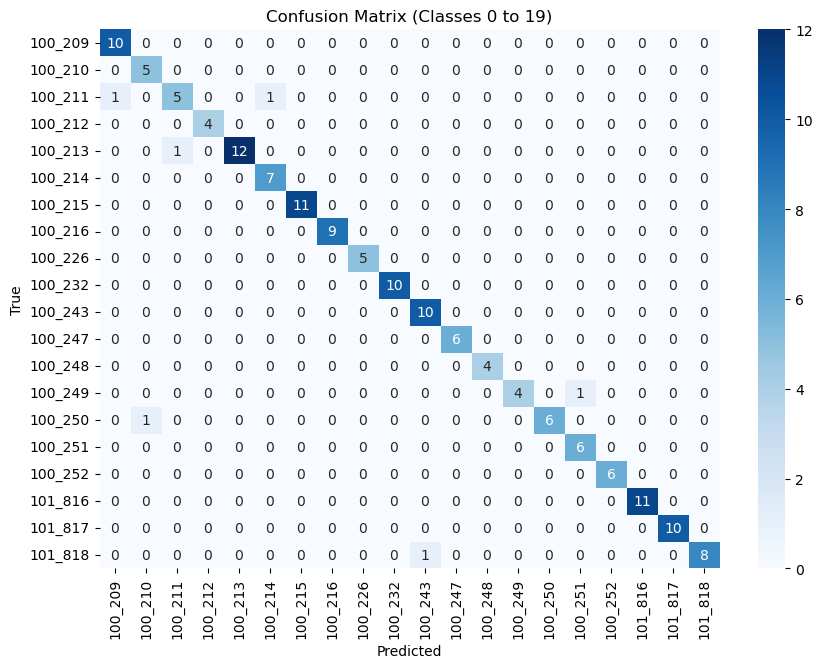

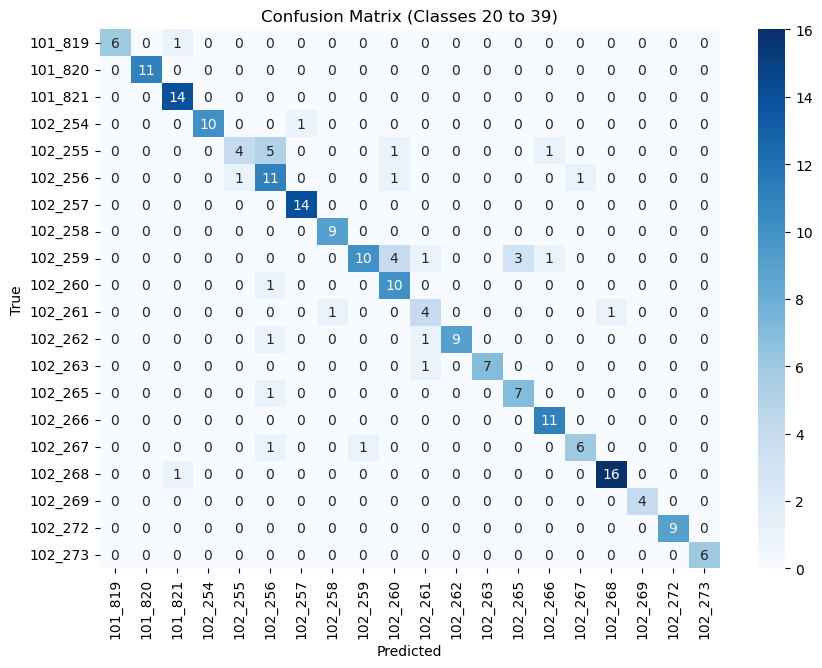

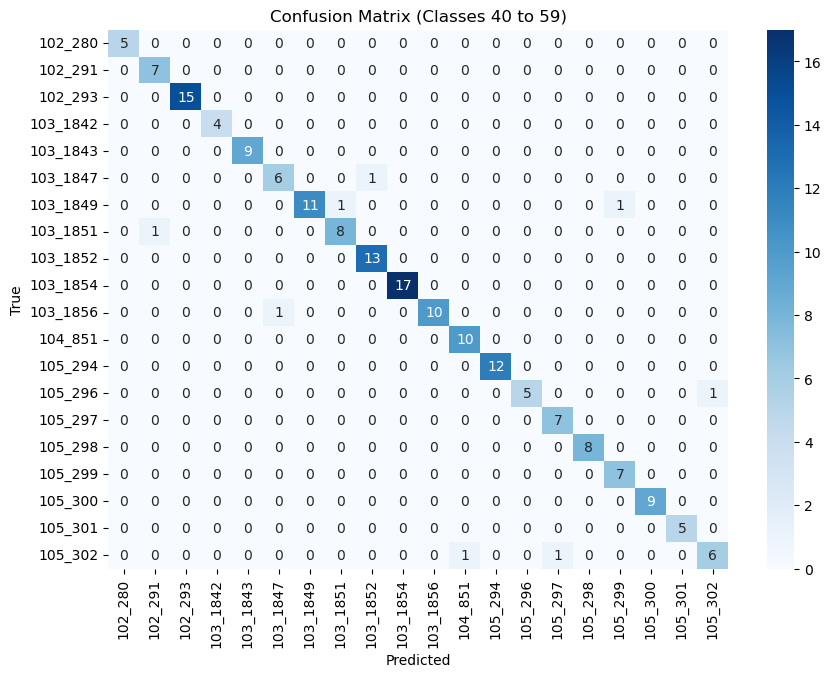

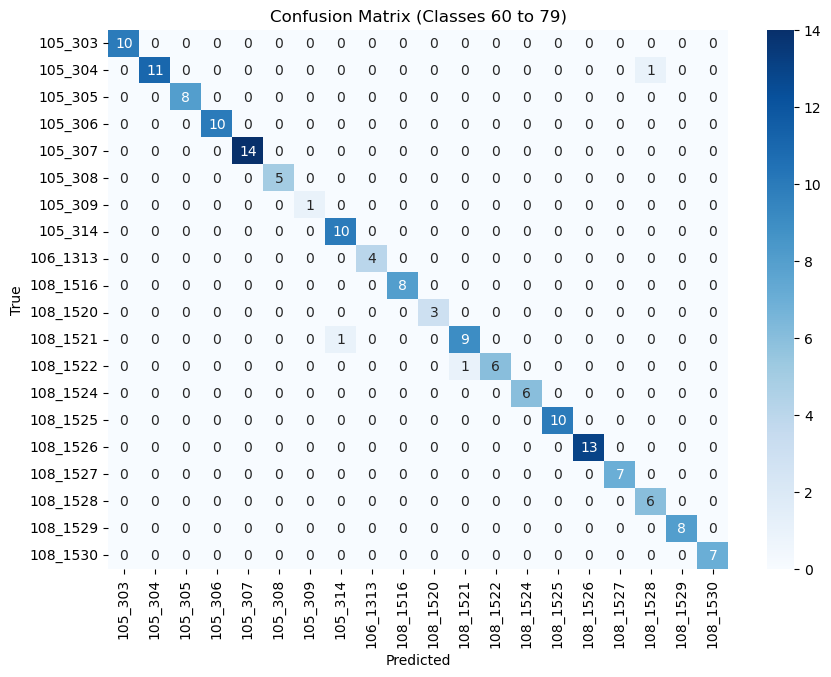

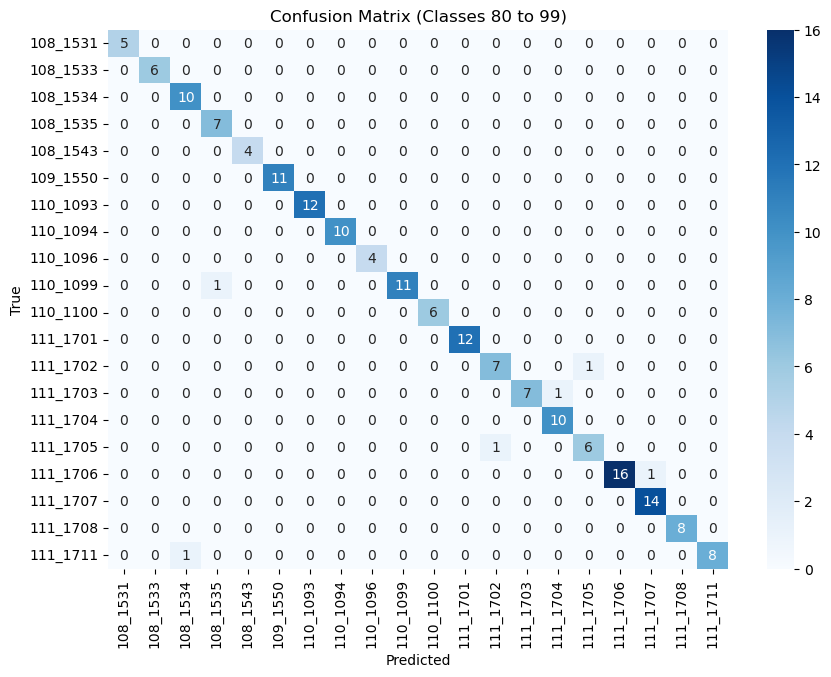

...

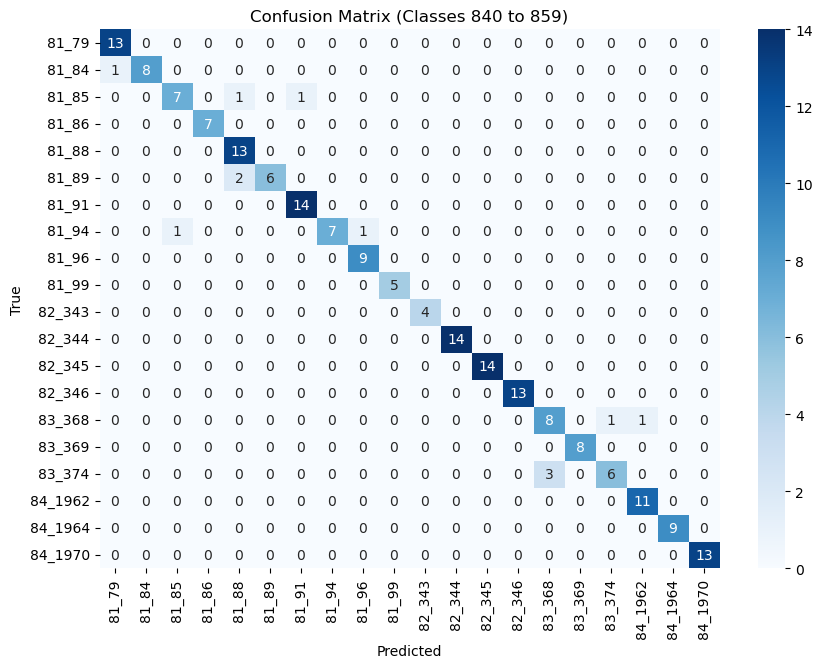

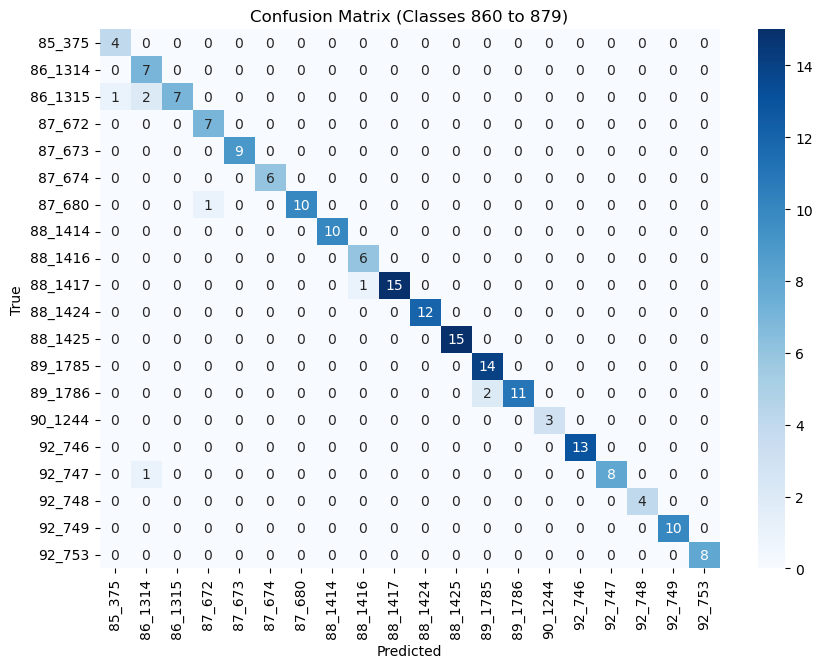

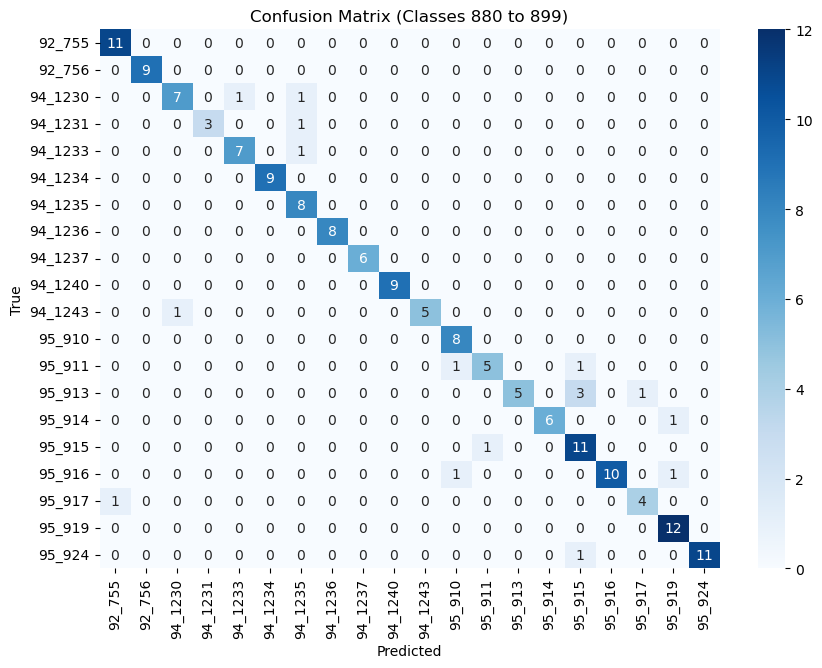

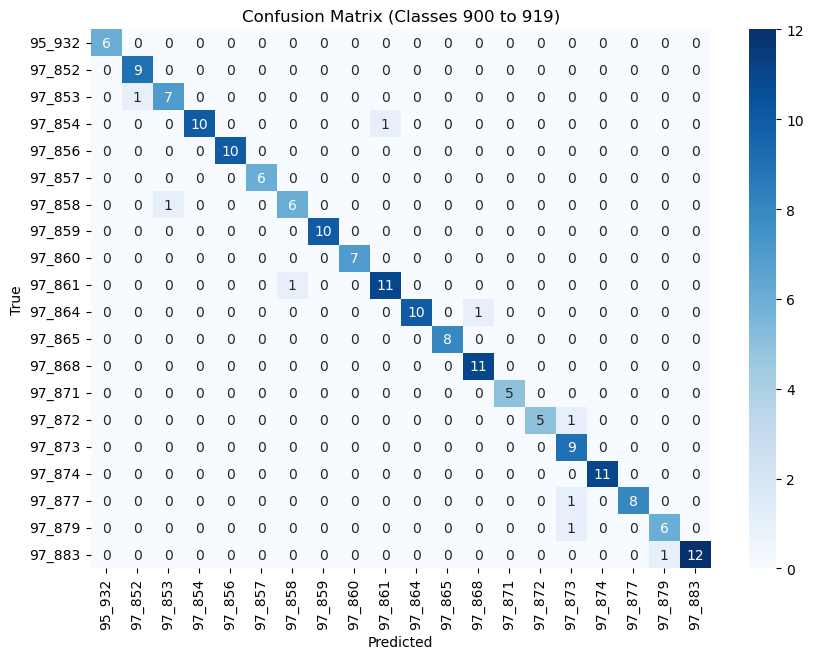

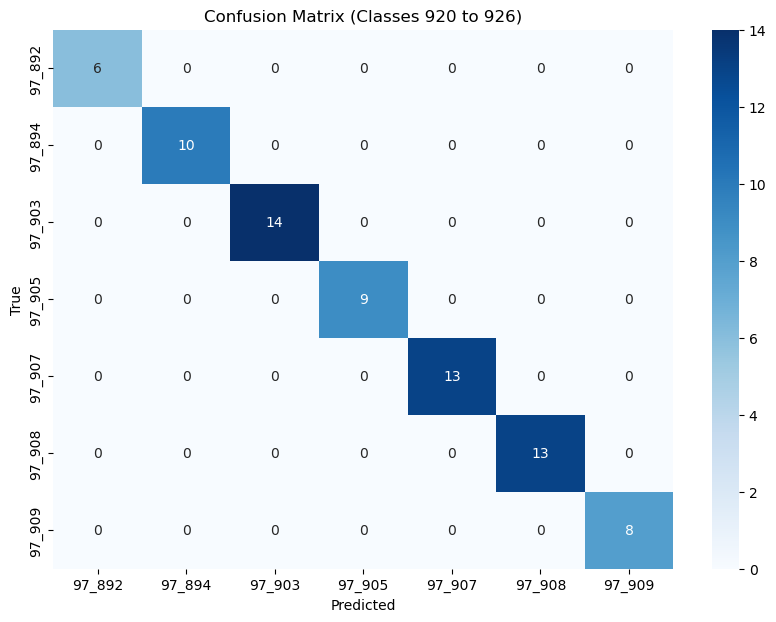

In [35]:
def plot_confusion_matrix_by_groups(dataloader, model, class_names, group_size=20, save_dir='confusion_matrices'):
    true_labels = []
    predicted_labels = []

    
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    with torch.no_grad():
        for batch_x, batch_y in dataloader:
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)

            
            y_pred = model(batch_x)
            predicted_classes = torch.argmax(y_pred, dim=1)

            true_labels.extend(batch_y.cpu().numpy())
            predicted_labels.extend(predicted_classes.cpu().numpy())

    # Generate confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    
    num_classes = len(class_names)
    num_groups = int(np.ceil(num_classes / group_size))

    for group in range(num_groups):
        start_idx = group * group_size
        end_idx = min(start_idx + group_size, num_classes)
        
        # Take the grouped confusion-matrix
        cm_sub = cm[start_idx:end_idx, start_idx:end_idx]
        class_names_sub = class_names[start_idx:end_idx]
        
        plt.figure(figsize=(10, 7))
        sns.heatmap(cm_sub, annot=True, fmt='g', cmap='Blues', xticklabels=class_names_sub, yticklabels=class_names_sub)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title(f'Confusion Matrix (Classes {start_idx} to {end_idx-1})')
        
        # Save the figure
        filename = os.path.join(save_dir, f'confusion_matrix_{start_idx}_{end_idx-1}.png')
        plt.savefig(filename)
        

plot_confusion_matrix_by_groups(test_loader, model, class_names, group_size=20)
